# Vietnamese Handwritten Recognition with CRNN model

## Load Data

In [ ]:
import tensorflow as tf
from google.colab import drive
drive.mount('/content/gdrive')
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  # RIP Training time
  raise SystemError('GPU device not found')
  print('Found GPU at: {}'.format(device_name))

Mounted at /content/gdrive


In [ ]:
import os
# path to our directory images

DATA_PATH = '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data'
DATA_SELF_GENERATED_PATH = '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data'

TEST_FOLDER = '/content/gdrive/MyDrive/CNTT2/DATASET/raw/test'
TRAIN_FOLDER = '/content/gdrive/MyDrive/CNTT2/DATASET/raw/train'

TRAIN_JSON = '/content/gdrive/MyDrive/CNTT2/DATASET/raw/labels.json'
SELF_GENERATED_TRAIN_JSON = '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_labels.json'

BEST_CHECKPOINT_WEIGHT = '/content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/best_weights_epochs.hdf5'
LOG_TENSORBOARD = '/content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/logs'

STRUCTURE_MODEL_IMG = '/content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/model.png'

data_paths = [DATA_PATH, DATA_SELF_GENERATED_PATH]

In [ ]:
import json
# open these label jsons files
train_labels = {}
self_train_labels = {}
with open(TRAIN_JSON, 'r', encoding='utf8') as f:
  train_labels = json.load(f)

with open(SELF_GENERATED_TRAIN_JSON, 'r', encoding='utf8') as f:
  self_train_labels = json.load(f)

# join two objects
train_labels.update(self_train_labels)

In [ ]:
train_labels

{'1.jpg': 'Số 3 Nguyễn Ngọc Vũ, Hà Nội',
 '2.jpg': 'Số 30 Nguyên Hồng, Láng Hạ, Đống Đa, Hà Nội',
 '3.jpg': '58 Thái Thịnh, Đống Đa, Hà Nội',
 '4.jpeg': 'Số 370/8 khu phố 5B, phường Tân Biên, Biên Hòa, Đồng Nai',
 '5.jpg': 'Vĩnh Trung Plaza, B, 255-257 đường Hùng Vương, phường Vĩnh Trung',
 '6.jpg': 'Tòa nhà 34T, Hoàng Đạo Thúy, Hà Nội',
 '7.jpg': '40 Cát Linh, Đống Đa, Hà Nội',
 '8.jpg': 'phòng 101, tầng 1, lô 04-TT5B, khu đô thị Tây Nam Linh Đàm',
 '9.JPG': 'Nhà 87 ngõ 416 Đê La Thành',
 '10.JPG': 'Up coworking Space, 89 Láng Hạ, Hà Nội',
 '11.jpg': '192 Ngô Đức Kế, quận 1, Hồ Chí Minh',
 '12.jpg': 'số 5 Công Trường Mê Linh, phường Bến Nghé, quận 1',
 '13.jpg': '90A đường Mai Xuân Thưởng, tỉnh Gia Lai',
 '14.jpg': '96/7/12B Phạm Văn Đồng, thành phố Pleiku',
 '15.jpg': '168 Ngô Gia Tự, thành phố Hà Tĩnh',
 '0000_samples.png': 'Số 253 đường Trần Phú, Thị trấn Nam Sách, Huyện Nam Sách, Hải Dương',
 '0001_samples.png': 'Số 289 Đinh Bộ Lĩnh, Phường 26, Quận Bình Thạnh, TP Hồ Chí Minh',
 '

In [ ]:
#find all characters in labels
char_list = set()
for label in train_labels.values():
  char_list.update(set(label))
char_list = sorted(char_list)
len(char_list)

144

In [ ]:
# show all possible labels characters
"".join(char_list)

" #%'()+,-./0123456789:?ABCDEFGHIJKLMNOPQRSTUVWXYabcdeghiklmnopqrstuvwxyzÂÊÔàáâãèéêìíòóôõùúýĂăĐđĩũƠơưạảẤấầẩậắằẵặẻẽếềểễệỉịọỏốồổỗộớờởỡợụủỨứừửữựỳỵỷỹ"

In [ ]:
# convert the words to array of indexs based on the char_list
def encode_to_labels(txt):
  # encoding each output word into digits of indexes
  convert = []
  for index, char in enumerate(txt):
    try:
      convert.append(char_list.index(char))
    except:
      print("No found in char_list :", char)

  return convert

In [ ]:
encode_to_labels("Huỳnh Tấn Lợi - fine")

No found in char_list : f


[30, 66, 140, 59, 54, 0, 42, 103, 59, 0, 34, 131, 55, 0, 8, 0, 55, 59, 52]

In [ ]:
from pathlib import Path

train_image_path = []

for path in data_paths:
  train_image_path.extend([str(item) for item in Path(path).glob('*')])

In [ ]:
len(train_image_path)

2079

In [ ]:
train_image_path[:10]

['/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0800_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0805_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0810_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0841_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0850_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0792_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0812_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0836_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0826_samples.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0842_samples.png']

## Preprocessing
- Find all widths and heights of images
- Use openCV to read image
- Preprocess images (like converting images to greyscale)
- Resize images so all images will have the same size
- Split your dataset into trainset and testset
- Build CRNN model with CTC loss
- Prediction
- Calculate metrics for SER, WER and CER

In [ ]:
# Matching full absoluate paths and labels instead of filenames and labels
dict_filepath_label = {}

for path in data_paths:
  raw_data_path = Path(path)
  for item in raw_data_path.glob('*.*'):
    file_name = str(os.path.basename(item))
    label = train_labels[file_name]
    dict_filepath_label[str(item)] = label

In [ ]:
len(dict_filepath_label)

2079

In [ ]:
dict_filepath_label

{'/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0800_samples.png': 'Số 28 Hải Thượng Lãn ông, Phường 5, Thành Phố Đông Hà, Quảng Trị',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0805_samples.png': 'Tổ 21, Phường Quảng Phú, Thành Phố Quảng Ngãi, Quảng Ngãi',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0810_samples.png': 'Số 7, ngõ 47 Phố Đức Giang, Phường Đức Giang, Quận Long Biên, Hà Nội',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0841_samples.png': '1E Bình Giã, Phường 13, Quận Tân Bình, TP Hồ Chí Minh',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0850_samples.png': 'KP 1, Phường Phước Bình, Thị Xã Phước Long, Bình Phước',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0792_samples.png': '481 Trưng Nữ Vương, Phường Hoà Thuận Tây, Quận Hải Châu, Đà Nẵng',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0812_samples.png': 'ấp An Lợi, Xã An Bình A, Thị xã Hồng Ngự, Đồng Tháp',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/data/0836_samples.png': '88 Đinh Điền, Ph

In [ ]:
# find the maximum label length
max_label_len = max(len(label) for label in dict_filepath_label.values())

In [ ]:
max_label_len

69

In [ ]:
all_image_paths = list(dict_filepath_label.keys())

In [ ]:
# last 10 elements
all_image_paths[-10:]

['/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_232.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_233.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_234.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_235.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_236.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_237.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_238.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_239.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_240.png',
 '/content/gdrive/MyDrive/CNTT2/DATASET/raw/self_generated_data/raw_241.png']

In [ ]:
import cv2
# find all widths and heights of images (this is useful if our dataset images got different sizes)
widths = []
heights = []
for image_path in all_image_paths:
  img = cv2.imread(image_path)
  (height, width, _) = img.shape
  heights.append(height)
  widths.append(width)

In [ ]:
min_height = min(heights)
max_height = max(heights)
min_width = min(widths)
max_width = max(widths)

In [ ]:
(min_height, max_height, min_width, max_width)

(33, 376, 288, 2694)

In [ ]:
# Train test diversity with the ratio 8/2
from sklearn.model_selection import train_test_split
test_size = 0.2
train_image_paths, val_image_paths = train_test_split(all_image_paths, test_size=test_size, random_state=42)

In [ ]:
TIME_STEPS = 240

### Preprocessing function

In [ ]:
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter

def preprocessing_img(img_paths, pre_img, pre_text_img, input_length, label_length, orig_txt):
  resize_max_width = 0
  i = 0
  for train_img_path in img_paths:
    img = Image.open(train_img_path)

    # Bước 1: Tăng cường độ tương phản
    enhancer_contrast = ImageEnhance.Contrast(img)
    img = enhancer_contrast.enhance(1.5)

    # Bước 2: Làm rõ văn bản bằng kỹ thuật xử lý lọc
    img = img.filter(ImageFilter.MedianFilter(size=3))

    # Bước 3: Tăng cường độ sáng
    enhancer_brightness = ImageEnhance.Brightness(img)
    img = enhancer_brightness.enhance(1.2)
    # read input image and convert into gray scale image
    img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)

    height, width = img.shape

    # in this dataset, we don't need to do any resize at all here.
    img = cv2.resize(img,(int(118/height*width),118))

    height, width = img.shape

    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]

    # Padding image using median
    img = np.pad(img, ((0,0),(0, 2167-width)), 'median')

    # Blur it
    img = cv2.GaussianBlur(img, (5,5), 0)

    # Threshold the image using adapative threshold - binary images
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)

    # add channel dimension
    img = np.expand_dims(img , axis = 2)

    # Normalizes the pixel value of the image to the range from 0 to 1.
    img = img/255.

    label = dict_filepath_label[train_img_path]

    # split data into validation and training dataset as 10% and 90% respectively
    orig_txt.append(label)
    label_length.append(len(label))

    # our time steps for valid input
    input_length.append(TIME_STEPS)
    pre_img.append(img)

    # convert words to digits based on charlist
    pre_text_img.append(encode_to_labels(label))
    i += 1
    if (i%500 == 0):
      print ("has processed trained {} files".format(i))

  print(resize_max_width)
  return pre_img, pre_text_img, input_length, label_length, orig_txt

### Preprocessing - training dataset

In [ ]:
# lists for training dataset
training_img = []
training_txt = []
train_input_length = []
train_label_length = []
orig_txt = []

training_img, training_txt, train_input_length, train_label_length, orig_txt = preprocessing_img(
    train_image_paths,
    training_img,
    training_txt,
    train_input_length,
    train_label_length,
    orig_txt
    )

has processed trained 500 files
has processed trained 1000 files
has processed trained 1500 files
2167


In [ ]:
len(training_img)

1663

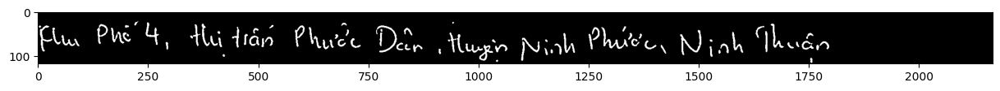

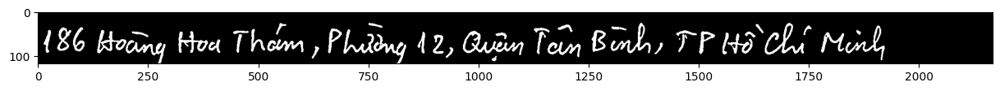

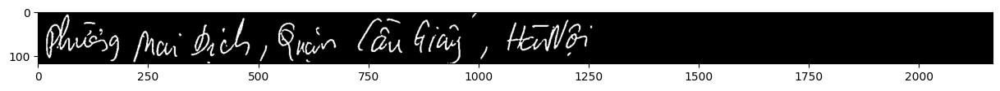

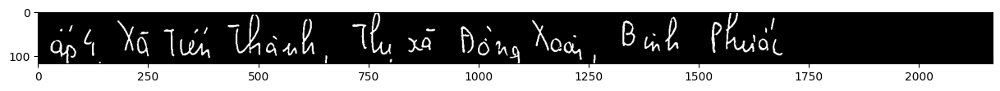

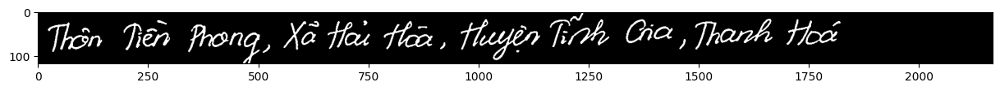

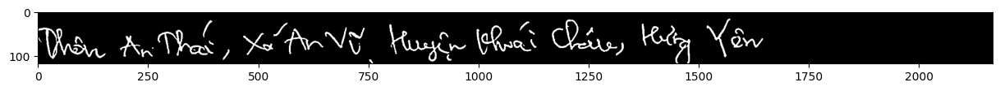

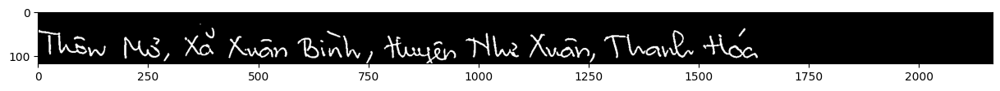

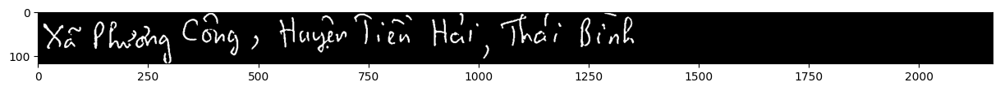

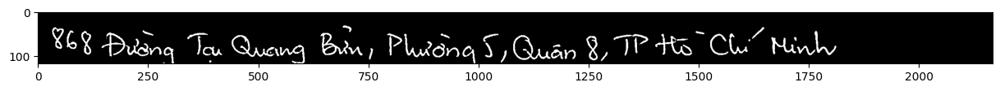

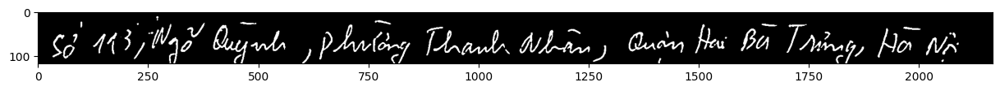

In [ ]:
import matplotlib.pyplot as plt
for i in range(len(training_img)-10, len(training_img)):
  plt.figure(figsize=(15,2))
  plt.imshow(training_img[i][:,:,0], cmap="gray")
  plt.show()

### Preprocessing - valid dataset

In [ ]:
#lists for validation dataset
valid_img = []
valid_txt = []
valid_input_length = []
valid_label_length = []
valid_orig_txt = []

valid_img, valid_txt, valid_input_length, valid_label_length, valid_orig_txt = preprocessing_img(
    val_image_paths,
    valid_img,
    valid_txt,
    valid_input_length,
    valid_label_length,
    valid_orig_txt
    )

2167


In [ ]:
len(valid_img)

416

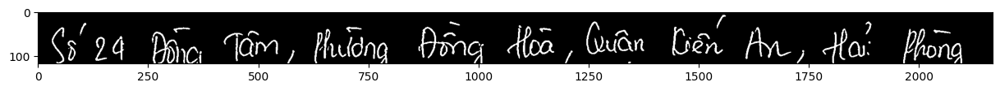

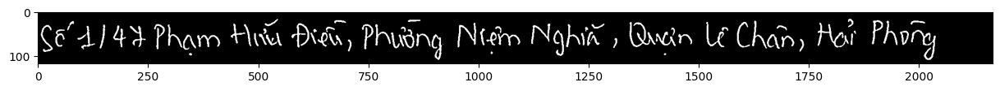

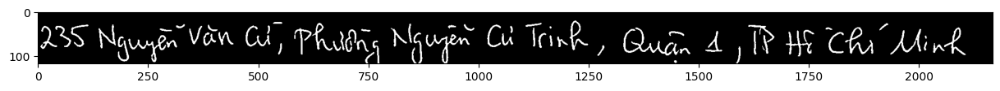

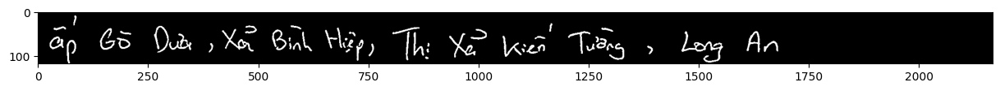

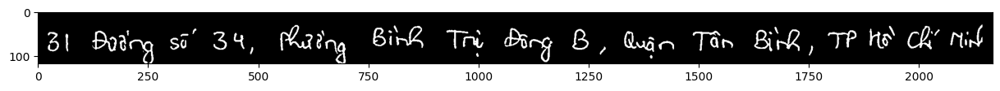

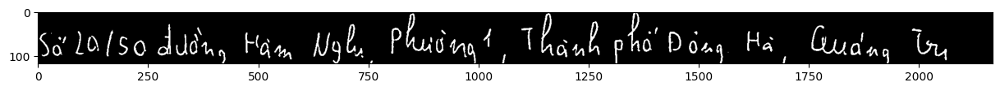

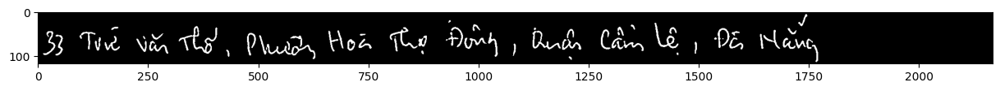

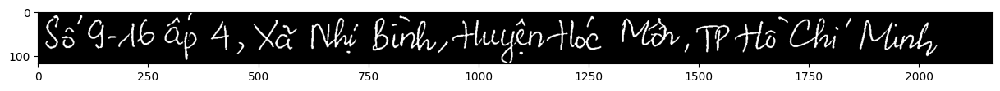

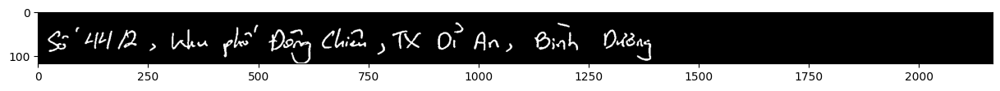

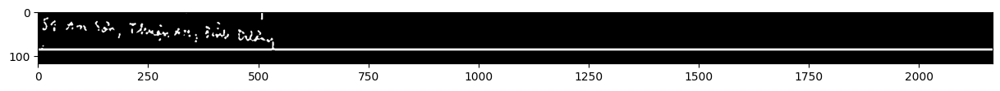

In [ ]:
import matplotlib.pyplot as plt
for i in range(len(valid_img)-10, len(valid_img)):
  plt.figure(figsize=(15,2))
  plt.imshow(valid_img[i][:,:,0], cmap="gray")
  plt.show()

In [ ]:
max_label_len = TIME_STEPS

In [ ]:
# import padding library
from keras.utils import pad_sequences

# pad each output label to maximum text length, remember we did that so that we keep training with rnn consistent?
train_padded_txt = pad_sequences(training_txt, maxlen = max_label_len, padding='post', value = 0)
valid_padded_txt = pad_sequences(valid_txt, maxlen = max_label_len, padding='post', value = 0)

In [ ]:
train_padded_txt[0]

array([ 42,  54,  86,  59,   0,  42,  54,  48,  59,  54,   0,  34,  99,
        98,  59,  53,   7,   0,  46,  78,   0,  39,  66,  48,  59,  53,
         0,  42,  54, 119,  59,  54,   7,   0,  30,  66,  70, 117,  59,
         0,  34, 100,  59,  53,   0,  29,  55,  48,  59,  53,   7,   0,
        24, 107,  50,   0,  29,  55,  48,  59,  53,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

## Model Building

In [ ]:
# import our model, different layers and activation function
from keras.layers import Layer, Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional, Add, Activation, RepeatVector, Permute, multiply, InputSpec
from keras.models import Model
from keras.activations import relu, sigmoid, softmax
import keras.backend as K
from keras.utils import to_categorical, plot_model
from keras.callbacks import CSVLogger, TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


### Structure

In [ ]:
# input with shape of height=32 and width=128
inputs = Input(shape=(118,2167,1))

# Block 1
x = Conv2D(64, (3,3), padding='same')(inputs)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_1 = x

# Block 2
x = Conv2D(128, (3,3), padding='same')(x)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_2 = x

# Block 3
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_3 = x

# Block4
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_3])
x = Activation('relu')(x)
x_4 = x

# Block5
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_5 = x

# Block6
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_5])
x = Activation('relu')(x)

# Block7
x = Conv2D(1024, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(3, 1))(x)
x = Activation('relu')(x)

# pooling layer with kernel size (3,1) to make the height/3 #(1,9,512) to (1, 3, 512)
x = MaxPool2D(pool_size=(3, 1))(x)

# # to remove the first dimension of one: (1, 3, 512) to (3, 512)
squeezed = Lambda(lambda x: K.squeeze(x, 1))(x)

# # # bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(512, return_sequences=True, dropout=0.25))(squeezed)
blstm_2 = Bidirectional(LSTM(512, return_sequences=True, dropout=0.25))(blstm_1)

# # this is our softmax character proprobility with timesteps
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time

act_model = Model(inputs, outputs)

In [ ]:
act_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 118, 2167,   0           []                               
                                1)]                                                               
                                                                                                  
 conv2d (Conv2D)                (None, 118, 2167, 6  640         ['input_1[0][0]']                
                                4)                                                                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 39, 722, 64)  0           ['conv2d[0][0]']                 
                                                                                              

### Callback

In [ ]:
### ctc definition part
# define the label input shape for ctc
labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')
# define the length of input and label for ctc
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

# define a ctc lambda function to take arguments and return ctc_bach_cost
def ctc_lambda_func(args):
  y_pred, labels, input_length, label_length = args
  """
  labels: tensor (number of samples, max_string_length) containing the truth labels.
  y_pred: tensor (number of samples, time_steps, num_character_labels) containing the prediction, or output of the softmax.
  input_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_pred.
  label_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_true.
  """
  return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

# out loss function (just take the inputs and put it in our ctc_batch_cost)
loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, labels, input_length, label_length], outputs=loss_out)

In [ ]:
# ready ctc loss function and optimizers
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = 'adam')

# our callbacks hell to optimize our learning
callbacks = [
    TensorBoard(
        log_dir=LOG_TENSORBOARD,
        histogram_freq=10,
        profile_batch=0,
        write_graph=True,
        write_images=False,
        update_freq="epoch"),
    ModelCheckpoint(
        filepath=os.path.join(BEST_CHECKPOINT_WEIGHT),
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        verbose=1,
        mode='min'),
    EarlyStopping(
        monitor='val_loss',
        min_delta=0,
        patience=25,
        restore_best_weights=True,
        verbose=0,
        mode='min'),
    ReduceLROnPlateau(
        monitor='val_loss',
        min_delta=1e-8,
        factor=0.2,
        patience=20,
        verbose=1)
]
callbacks_list = callbacks

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 118, 2167,   0           []                               
                                1)]                                                               
                                                                                                  
 conv2d (Conv2D)                (None, 118, 2167, 6  640         ['input_1[0][0]']                
                                4)                                                                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 39, 722, 64)  0           ['conv2d[0][0]']                 
                                                                                            

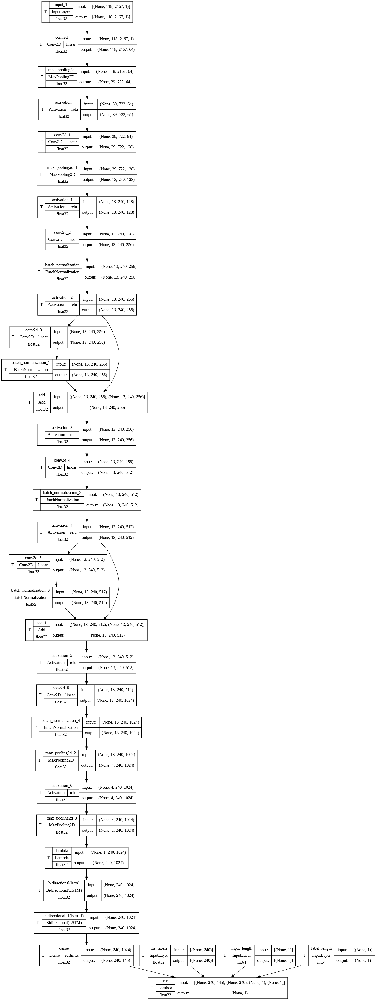

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file=STRUCTURE_MODEL_IMG,
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96,
    layer_range=None,
    show_layer_activations=True,
    show_trainable=True,
)

In [ ]:
# ready our training data
training_img = np.array(training_img)
train_input_length = np.array(train_input_length)  # all must be equal length to T timesteps
train_label_length = np.array(train_label_length)  # different length (only the same in Captcha dataset)

# ready our validating data
valid_img = np.array(valid_img)
valid_input_length = np.array(valid_input_length) # all must be equal length to T timesteps
valid_label_length = np.array(valid_label_length) # different length (only the same in Captcha dataset)

In [ ]:
training_img[:1]

array([[[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]]]])

In [ ]:
valid_img[:1]

array([[[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]]]])

### Training

In [ ]:
# choose batchsize and epochs

batch_size = 32
epochs = 100

history = model.fit(x=[training_img, train_padded_txt, train_input_length, train_label_length],
          y=np.zeros(len(training_img)),
          batch_size=batch_size,
          epochs = epochs,
          validation_data = ([valid_img, valid_padded_txt, valid_input_length, valid_label_length], [np.zeros(len(valid_img))]),
          verbose = 1, callbacks = callbacks_list)

Epoch 1/100
52/52 [==============================] - ETA: 0s - loss: 221.3558
Epoch 1: val_loss improved from inf to 198.28491, saving model to /content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/best_weights_epochs.hdf5
52/52 [==============================] - 152s 2s/step - loss: 221.3558 - val_loss: 198.2849 - lr: 0.0010
Epoch 2/100
52/52 [==============================] - ETA: 0s - loss: 171.2929
Epoch 2: val_loss improved from 198.28491 to 166.06964, saving model to /content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/best_weights_epochs.hdf5
52/52 [==============================] - 67s 1s/step - loss: 171.2929 - val_loss: 166.0696 - lr: 0.0010
Epoch 3/100
52/52 [==============================] - ETA: 0s - loss: 147.1158
Epoch 3: val_loss improved from 166.06964 to 147.80653, saving model to /content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/best_weights_epochs.hdf5
52/52 [==============================] - 72s 1s/step - loss: 147.1158 - val_loss: 147.8065 - lr: 0.0010
Epoch 4/100
52/52 [==

In [ ]:
model.save('/content/gdrive/MyDrive/CNTT2/DATASET/model/trained_model.h5')

## Evaluation
*   Character Error Rate
*   Word Error Rate

In [ ]:
# load the saved best model weights
act_model.load_weights(os.path.join(BEST_CHECKPOINT_WEIGHT))

In [ ]:
NO_PREDICTS = 100
OFFSET = 0
prediction = act_model.predict(valid_img)

13/13 [==============================] - 6s 386ms/step


In [ ]:
prediction.shape

(416, 240, 145)

In [ ]:
# use CTC decoder
out = K.get_value(K.ctc_decode(prediction, input_length=np.ones(prediction.shape[0])*prediction.shape[1],
                         greedy=True)[0][0])
# see the results
all_predictions =[]
i = 0
for x in out:
  print("original_text  = ", valid_orig_txt[i+OFFSET])
  print("predicted text = ", end = '')
  pred = ""
  for p in x:
    if int(p) != -1:
      pred += char_list[int(p)]
  print(pred)
  all_predictions.append(pred)
  i += 1

original_text  =  Số 37, Tổ 2, Phường Minh Khai, Thành phố Phủ Lý, Hà Nam
predicted text = Số 37, Tổ 2, Phường Minh Khai, Thành phố Phủ Lý, Hà Nam
original_text  =  470 Cách Mạng Tháng 8, Quận 3
predicted text = 2c o L, Tng Tn Thun
original_text  =  Trụ sở UBND xã Bảo Nhai, Huyện Bắc Hà, Lào Cai
predicted text = Trạ sở UBND xã Bảo Nhai, Huyện Bắc Hà, Lào Cai
original_text  =  172 ấp Bình Hưng, Xã Bình Phan, Huyện Chợ Gạo, Tiền Giang
predicted text = 172 ấp Bình Hưng, Xã Bình Phan, Huyện Chợ Gạo, Tiền Giang
original_text  =  169K1B, Phường Phú Diễn, Quận Bắc Từ Liêm, Hà Nội
predicted text = 169K1B, Phường Phú Diễn, Quận Bắc Từ Liêm, Hà Nội
original_text  =  K484/4 Trần Cao Vân, Phường Xuân Hà, Quận Thanh Khê, Đà Nẵng
predicted text = K484/4 Trần Cao Vân, Phường Xuân Hà, Quận Thanh Khê, Đà Nẵng
original_text  =  Số 126A Đô Lương, Phường 11, Thành Phố Vũng Tàu, Bà Rịa - Vũng Tàu
predicted text = Số 1226A Đô Lương, Phường 11, Thành Phố Vũng Tàu, Bà Rịa - Vũng Tàu
original_text  =  168 Ngô 

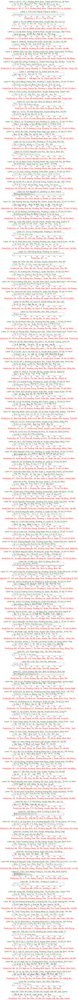

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.figure(figsize=(10,200))
col=0
row=1
gs1 = gridspec.GridSpec(NO_PREDICTS, 1)
for n in range(NO_PREDICTS):
  plt.subplot(gs1[n])
  plt.imshow(valid_img[n][:,:,0], cmap="gray_r")
  plt.title(f"Label {n}: "+valid_orig_txt[n+OFFSET], fontsize=20, color="green")
  plt.xlabel(f"Prediction {n}: "+all_predictions[n+OFFSET], fontsize=20, color="red")


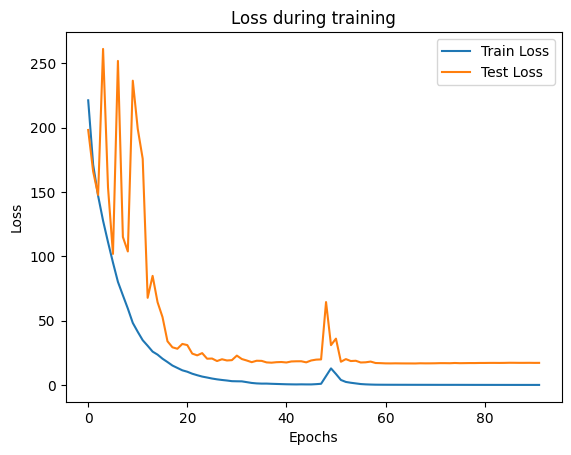

In [ ]:
loss_train = history.history['loss']
loss_test = history.history['val_loss']

plt.plot(loss_train, label='Train Loss')
plt.plot(loss_test, label='Test Loss')
plt.title('Loss during training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
import string
import unicodedata
import editdistance

def ocr_metrics(predicts, ground_truth, norm_accentuation=False, norm_punctuation=False):
    if len(predicts) == 0 or len(ground_truth) == 0:
      return (1, 1)

    cer, wer = [], []

    for (pd, gt) in zip(predicts, ground_truth):

      if norm_accentuation:
        pd = unicodedata.normalize("NFKD", pd).encode("ASCII", "ignore").decode("ASCII")
        gt = unicodedata.normalize("NFKD", gt).encode("ASCII", "ignore").decode("ASCII")

      if norm_punctuation:
        pd = pd.translate(str.maketrans("", "", string.punctuation))
        gt = gt.translate(str.maketrans("", "", string.punctuation))

      pd_cer, gt_cer = list(pd.lower()), list(gt.lower())
      dist = editdistance.eval(pd_cer, gt_cer)
      cer.append(dist / (max(len(pd_cer), len(gt_cer))))

      pd_wer, gt_wer = pd.lower().split(), gt.lower().split()
      dist = editdistance.eval(pd_wer, gt_wer)
      wer.append(dist / (max(len(pd_wer), len(gt_wer))))

    cer_f = sum(cer) / len(cer)
    wer_f = sum(wer) / len(wer)

    return (cer_f, wer_f)

In [ ]:
evaluate = ocr_metrics(predicts=all_predictions,
                                ground_truth=valid_orig_txt,
                                norm_accentuation=False,
                                norm_punctuation=False)
evaluate_string = "\n".join([
    "Metrics:",
    "Character Error Rate (CER): {}%".format(round(evaluate[0]*100, 2)),
    "Word Error Rate (WER):      {}%".format(round(evaluate[1]*100, 2)),
])

print(evaluate_string)

Metrics:
Character Error Rate (CER): 5.83%
Word Error Rate (WER):      17.66%


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir='/content/gdrive/MyDrive/CNTT2/DATASET/model/crnn/logs' --port=6767

<IPython.core.display.Javascript object>

# Translator

In [ ]:
!pip install googletrans==4.0.0-rc1

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 8.0 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17396 sha256=f811710c43bed4a8c79ffd5d796161c282782b68cd326ce420fd513f2ac7724c
  Stored in directory: /root/.cache/pip/wheels/c0/59/9f/7372f0cf70160fe61b528532e1a7c8498c4becd6bcffb022de
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 4.0.0
    Uninstalling ch